In [1]:
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import plotly.express as px
warnings.filterwarnings('ignore')

In [2]:
# Import training data labels into df set index to unique ID
training_df = pd.read_csv('./../Training Set Values.csv').set_index('id')

# Import training data labels into df
training_df_labels = pd.read_csv('./../Training Set Labels.csv').set_index(
    'id')

# Join Training labels and values into single DF by there ID
df = training_df.join(training_df_labels, on='id')

# Track columns as I work
column_tracker = list(df.columns)

print(df.shape)

(59400, 40)


In [3]:
len(column_tracker)

40

#  Drop zero variance columns

In [4]:
# Drop zero variance columns
# Count numbers of unique values double checking pandas profiler
counts = df.nunique()

# Identify columns with a constant vale (zero variance)
zero_variance_predictors = [
    df.columns[i] for i, v in enumerate(counts) if v == 1
]

# Delete identified zero variance columns from our main data frame
df = df.drop(columns=zero_variance_predictors)
column_tracker.remove('recorded_by')
df.shape



(59400, 39)

In [5]:
test_df = pd.read_csv('./../Test Set Values.csv').set_index(
    'id')

## Drop zero variance columns test data

In [6]:
# Drop zero variance columns
# Count numbers of unique values double checking pandas profiler
counts = test_df.nunique()

# Delete identified zero variance columns from our main data frame
test_df = test_df.drop(columns=zero_variance_predictors)
test_df.shape

(14850, 38)

# Column 1 / 39 Amount_TSH
- 1st iteration binarized this as positive or not
- 2nd iteration we will use more bins to hopefully derive better predictors

In [7]:
column_tracker[1-1]

'amount_tsh'

#### Training Data

AxesSubplot(0.125,0.125;0.775x0.755)


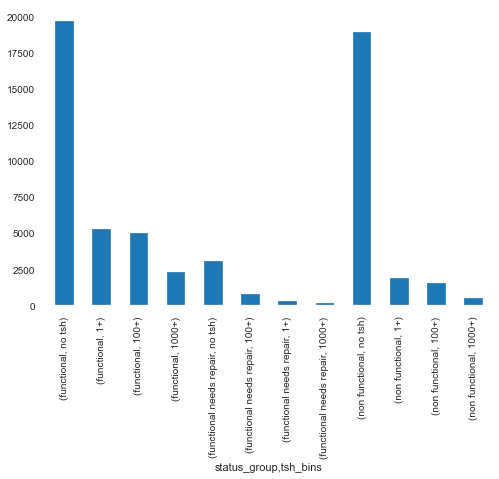

In [8]:
# Create labels to easily identify what size population lives at that well
tsh_cut_labels = [
    'no tsh', '1+', '100+','1000+' 
]

# Create bin ranges for population segments
tsh_bins = [0,1,100,1000,df.amount_tsh.max()]

# Create new categorical column called population size and use 'cut' to create the bins
df['tsh_bins'] = pd.cut(df['amount_tsh'],
                                         bins=tsh_bins,
                                         labels=tsh_cut_labels,
                                         include_lowest=True)

# View the results of the binning
print(df.groupby('status_group').tsh_bins.value_counts().plot(kind='bar'))

# Drop the original column only leaving the new column
df = df.drop(columns='amount_tsh')

#### Test Data

In [9]:
# Create labels to easily identify what size population lives at that well
tsh_cut_labels = [
    'no tsh', '1+', '100+','1000+' 
]

# Create bin ranges for population segments
tsh_bins = [0,1,100,1000,test_df.amount_tsh.max()]

# Create new categorical column called population size and use 'cut' to create the bins
test_df['tsh_bins'] = pd.cut(test_df['amount_tsh'],
                                         bins=tsh_bins,
                                         labels=tsh_cut_labels,
                                         include_lowest=True)

# Drop the original column only leaving the new column
test_df = test_df.drop(columns='amount_tsh')

# Column 2/ 39 Date Recorded
- 1st iteration removed this column
- 2nd Iteration use the date as the group most likely worked in clusters

In [10]:
column_tracker[2-1]

'date_recorded'

In [11]:
import datetime as dt

# Convert to datetime
df.date_recorded = pd.to_datetime(df.date_recorded)

df['date_recorded'] = df['date_recorded'].astype('int64')//1e9

In [12]:
# Convert to datetime
test_df.date_recorded = pd.to_datetime(test_df.date_recorded)

# Convert to epoch time
test_df['date_recorded'] = test_df['date_recorded'].astype('int64')//1e9

# Column 3/39 Funder 
- 1st Iteration used top 5 Funders
- 2nd iteration will use top 10 Funders

In [13]:
column_tracker[3-1]

'funder'

#### Training Data

In [14]:
# Get missing values
print('Missing Values:', df.funder.isnull().sum())

# Find and create list for top 5 funders
top_funders = df.funder.value_counts().index.tolist()[:10]

# Print the number of categorical data selected
print('Number of Categories labeled:',len(top_funders))

# if funder not in top_funders list reclassify as 'unkown/other'
df['top_funders'] = df.funder.apply(
    lambda x: x if x in top_funders else 'other/unkown')

# Check to make sure there are no missing values in the new columns
print('Missing Values After:',df.top_funders.isnull().sum())

# What percent of the data is our top 5 funders?
print(f'Percent of data labeled: {df.funder.value_counts(normalize=True).head(10).sum():.2%}')

# Drop original column
df = df.drop(columns='funder')

Missing Values: 3635
Number of Categories labeled: 10
Missing Values After: 0
Percent of data labeled: 40.23%


#### Test Data

In [15]:
# Get missing values
print('Missing Values:', test_df.funder.isnull().sum())

# Find and create list for top 5 funders
top_funders = test_df.funder.value_counts().index.tolist()[:10]

# Print the number of categorical data selected
print('Number of Categories labeled:',len(top_funders))

# if funder not in top_funders list reclassify as 'unkown/other'
test_df['top_funders'] = test_df.funder.apply(
    lambda x: x if x in top_funders else 'other/unkown')

# Check to make sure there are no missing values in the new columns
print('Missing Values After:',test_df.top_funders.isnull().sum())

# What percent of the data is our top 5 funders?
print(f'Percent of data labeled: {test_df.funder.value_counts(normalize=True).head(10).sum():.2%}')

# Drop original column
test_df = test_df.drop(columns='funder')

Missing Values: 869
Number of Categories labeled: 10
Missing Values After: 0
Percent of data labeled: 40.65%


# Column 4/39 GPS Height
- 1st iteration we used as is
- 2nd iteration looked at values <=0 more and decided to leave it and add a binary column for < 0
- 3rd iteration dropping column
- 4th iteration using as is

In [16]:
column_tracker[4-1]

'gps_height'

#### Training Data

In [17]:
# Create new below sea level binary column
#df['below_sea_level'] = (df.gps_height < 0).astype(int)
#df.drop(columns='gps_height',inplace=True)

#### Test Data

In [18]:
# Create new below sea level binary column
#test_df['below_sea_level'] = (test_df.gps_height < 0).astype(int)
#test_df.drop(columns='gps_height',inplace=True)

#### Exploration

In [19]:
# sns.distplot(df.gps_height)

In [20]:
# df.loc[df.gps_height < 0].groupby('status_group').gps_height.agg(['median','count','mean'])

In [21]:
# gps_viz_df = df.loc[df.gps_height == 0]


# default_public_token = 'pk.eyJ1IjoiYnNhbWFoYSIsImEiOiJja2M5OHZrYmIwMXZhMnNtdXB3Ynl1bW45In0.T9VEPlgv1PVatWdX_R27dQ'
# px.set_mapbox_access_token(default_public_token)
# fig = px.scatter_mapbox(gps_viz_df,
#                         lat="latitude",
#                         lon="longitude",
#                         color="status_group",
#                         color_continuous_scale=px.colors.cyclical.IceFire)
# fig.show()
# #fig.write_html("./Data/Iter_1/iter_1_false_negatives_df.html")

# Column 5/39 Installer
- 1st iteration used top 5 values
- 2nd iteration we will use the same top 5 values

In [22]:
column_tracker[5-1]

'installer'

#### Training Data

In [23]:
# Examine the counts of each category
df.installer.value_counts()

# Get missing values
print('Missing Values:', df.installer.isnull().sum())

# Find and create list for top 5 installers
top_installers = df.installer.value_counts().index.tolist()[:5]

# Print the number of categorical data selected
print('Number of Categories labeled:',len(top_installers))

# if installer not in top_installers list reclassify as 'unkown/other'
df['top_installers'] = df.installer.apply(
    lambda x: x if x in top_installers else 'other/unkown')

# Check to make sure there are no missing values in the new columns
print('Missing Values After:',df.top_installers.isnull().sum())

# What percent of the data is our top 5 installers?
print(f'Percent of data labeled: {df.installer.value_counts(normalize=True).head(5).sum():.2%}')

# drop the old column
df.drop(columns='installer',inplace=True)

Missing Values: 3655
Number of Categories labeled: 5
Missing Values After: 0
Percent of data labeled: 40.44%


#### Test Data

In [24]:
# Examine the counts of each category
test_df.installer.value_counts()

# Get missing values
print('Missing Values:', test_df.installer.isnull().sum())

# Find and create list for top 5 installers
top_installers = test_df.installer.value_counts().index.tolist()[:5]

# Print the number of categorical data selected
print('Number of Categories labeled:',len(top_installers))

# if installer not in top_installers list reclassify as 'unkown/other'
test_df['top_installers'] = test_df.installer.apply(
    lambda x: x if x in top_installers else 'other/unkown')

# Check to make sure there are no missing values in the new columns
print('Missing Values After:',test_df.top_installers.isnull().sum())

# What percent of the data is our top 5 installers?
print(f'Percent of data labeled: {test_df.installer.value_counts(normalize=True).head(5).sum():.2%}')

# Drop the old column
test_df.drop(columns='installer',inplace=True)

Missing Values: 877
Number of Categories labeled: 5
Missing Values After: 0
Percent of data labeled: 40.36%


In [25]:
# df.installer.value_counts()

# Column 6/39 Longitude
- 1st iteration we removed all 0 values
- 2nd iteration we will replace 0 with nan values and leave it alone since XGBClassifier can address it
- iteration 4 remove

In [26]:
column_tracker[6-1]

'longitude'

#### Training Data

In [27]:
# # Mark 0 Values as nan as this is a placeholder for bad data
df.longitude.replace(0, np.nan, inplace=True)

# #check to make sure all values are null now
print('Null:',df.longitude.isnull().sum())

print('Zeroes:',(df.longitude == 0).sum())

Null: 1812
Zeroes: 0


#### Test Data

In [28]:
# Mark 0 Values as nan as this is a placeholder for bad data
test_df.longitude.replace(0, np.nan, inplace=True)

# Column 7/39 Latitude
- 1st Iteration Latitude Data was good
- 2nd Found placeholder setting to NaN

In [29]:
column_tracker[7-1]

'latitude'

#### Training Data

In [30]:
# # Change place holder values to NaN
df.latitude.replace(-2e-08, np.nan, inplace=True)

# # Print NaN Values
print('NaN:',df.latitude.isnull().sum())

# # Check placeholder value = 0
print('Placeholder should be zero:',(df.latitude == -2e-08).sum())

df.latitude.dropna(inplace=True)
print(df.latitude.isnull().sum())

NaN: 1812
Placeholder should be zero: 0
0


#### Test Data

In [31]:
# Change place holder values to NaN
test_df.latitude.replace(-2e-08, np.nan, inplace=True)
test_df.latitude.dropna(inplace=True)


# Column 8/39 WPT_Name
- 1st iteration used top 5 values
- 2nd iteration we will do the same
- 3rd iteration drop column

In [32]:
column_tracker[8-1]

'wpt_name'

#### Training Data

In [33]:
# # Examine the counts of each category
# df.wpt_name.value_counts()

# # Get missing values
# print('Missing Values:', df.wpt_name.isnull().sum())

# # Find and create list for top 5 installers
# top_wpt_names = df.wpt_name.value_counts().index.tolist()[:5]

# # Print the number of categorical data selected
# print('Number of Categories labeled:',len(top_wpt_names))

# # if wpt_name not in top_wpt_names list reclassify as 'unkown/other'
# df['top_wpt_names'] = df.wpt_name.apply(
#     lambda x: x if x in top_wpt_names else 'other/unkown')

# # Check to make sure there are no missing values in the new columns
# print('Missing Values After:',df.top_wpt_names.isnull().sum())

# # What percent of the data is our top 5 installers?
# print(f'Percent of data labeled: {df.wpt_name.value_counts(normalize=True).head(5).sum():.2%}')

df.drop(columns='wpt_name',inplace=True)

#### Test Data

In [34]:
# # Find and create list for top 5 installers
# top_wpt_names = test_df.wpt_name.value_counts().index.tolist()[:5]

# # if wpt_name not in top_wpt_names list reclassify as 'unkown/other'
# test_df['top_wpt_names'] = test_df.wpt_name.apply(
#     lambda x: x if x in top_wpt_names else 'other/unkown')

# # What percent of the data is our top 5 installers?
# print(f'Percent of data labeled: {test_df.wpt_name.value_counts(normalize=True).head(5).sum():.2%}')

test_df.drop(columns='wpt_name',inplace=True)

# Column 9/39 num_private
- 1st iteration removed column due to no information

In [35]:
column_tracker[9-1]

'num_private'

In [36]:
# Drop column on training data
df = df.drop(columns='num_private')

# Drop column on test data
test_df = test_df.drop(columns='num_private')

# Column 10/39 Basin
- 1st iteration we leave basin as is
- 2nd iteration leave basin as is
- 3rd iteration drop

In [37]:
column_tracker[10-1]

'basin'

#### Training Data

In [38]:
df.drop(columns='basin',inplace=True)

#### Test Data

In [39]:
test_df.drop(columns='basin',inplace=True)

#### Explorations

In [40]:
# basin_viz = df.loc[df.basin == 'Internal']


# default_public_token = 'pk.eyJ1IjoiYnNhbWFoYSIsImEiOiJja2M5OHZrYmIwMXZhMnNtdXB3Ynl1bW45In0.T9VEPlgv1PVatWdX_R27dQ'
# px.set_mapbox_access_token(default_public_token)
# fig = px.scatter_mapbox(basin_viz,
#                         lat="latitude",
#                         lon="longitude",
#                         color="status_group",
#                         color_continuous_scale=px.colors.cyclical.IceFire)
# fig.show()
# #fig.write_html("./Data/Iter_1/iter_1_false_negatives_df.html")

In [41]:
# gps_viz_df.groupby('status_group').basin.count()

In [42]:
# df.basin.value_counts()

# Column 11/39 - Subvillage
- 1st iteration used top 10
- 2nd iteration not using at all

In [43]:
column_tracker[11-1]

'subvillage'

#### Training Data

In [44]:
# Not using this data
df = df.drop(columns='subvillage')

#### Test Data

In [45]:
# Not using this data
test_df = test_df.drop(columns='subvillage')

# Column 12/39 - Region
- 1st iteration - used this data as it is clean data set
- 2nd iteration - will use this data as it is clean data

In [46]:
column_tracker[12-1]

'region'

#### Training Data

In [47]:
df.region.value_counts()

Iringa           5294
Shinyanga        4982
Mbeya            4639
Kilimanjaro      4379
Morogoro         4006
Arusha           3350
Kagera           3316
Mwanza           3102
Kigoma           2816
Ruvuma           2640
Pwani            2635
Tanga            2547
Dodoma           2201
Singida          2093
Mara             1969
Tabora           1959
Rukwa            1808
Mtwara           1730
Manyara          1583
Lindi            1546
Dar es Salaam     805
Name: region, dtype: int64

In [48]:
df.region.isnull().sum()

0

#### Test Data

# Column 13/39 Region Code
- 1st Iteration dropped this Column
- 2nd Iteration drop this column
- 3rd iteration used this column as is

In [49]:
column_tracker[13-1]

'region_code'

#### Training Data

In [50]:
df = df.drop(columns = 'region_code')

#### Test Data

In [51]:
test_df = test_df.drop(columns='region_code')

#### Exploration

In [52]:
# import plotly.express as px
# default_public_token = 'pk.eyJ1IjoiYnNhbWFoYSIsImEiOiJja2M5OHZrYmIwMXZhMnNtdXB3Ynl1bW45In0.T9VEPlgv1PVatWdX_R27dQ'
# px.set_mapbox_access_token(default_public_token)
# fig = px.scatter_mapbox(df,
#                         lat="latitude",
#                         lon="longitude",
#                         color="region_code",
#                         color_continuous_scale=px.colors.qualitative.Light24
#                        )
# fig.show()
# #fig.write_html("./Data/Well_Status_Map.html")

# Column 14/39 District Code
- 1st Iteration dropped column
- 2nd Keep this column as it provides a better granularity inside the regions

In [53]:
column_tracker[14-1]

'district_code'

#### Training Data


In [54]:
df.district_code.value_counts()

1     12203
2     11173
3      9998
4      8999
5      4356
6      4074
7      3343
8      1043
30      995
33      874
53      745
43      505
13      391
23      293
63      195
62      109
60       63
0        23
80       12
67        6
Name: district_code, dtype: int64

#### Test Data

#### Exploration

In [55]:
import plotly.express as px
default_public_token = 'pk.eyJ1IjoiYnNhbWFoYSIsImEiOiJja2M5OHZrYmIwMXZhMnNtdXB3Ynl1bW45In0.T9VEPlgv1PVatWdX_R27dQ'
px.set_mapbox_access_token(default_public_token)
fig = px.scatter_mapbox(df,
                        lat="latitude",
                        lon="longitude",
                        color="district_code",
                        color_continuous_scale=px.colors.qualitative.Light24
                       )
fig.show()
#fig.write_html("./Data/Well_Status_Map.html")

# Column 15/39 LGA
- 1st iteration used top 5
- 2nd iteration dropped this column

In [56]:
column_tracker[15-1]

'lga'

#### Training Data

In [57]:
df.drop(columns = 'lga',inplace=True)


#### Test Data

In [58]:
test_df.drop(columns = 'lga',inplace=True)


#### Exploration

In [59]:
# import plotly.express as px
# default_public_token = 'pk.eyJ1IjoiYnNhbWFoYSIsImEiOiJja2M5OHZrYmIwMXZhMnNtdXB3Ynl1bW45In0.T9VEPlgv1PVatWdX_R27dQ'
# px.set_mapbox_access_token(default_public_token)
# fig = px.scatter_mapbox(df,
#                         lat="latitude",
#                         lon="longitude",
#                         color="lga",
#                         color_continuous_scale=px.colors.qualitative.Light24
#                        )
# fig.show()
# #fig.write_html("./Data/Well_Status_Map.html")

In [60]:
# # Find and create list for top 5 subvillages
# top_lga = df.lga.value_counts().index.tolist()[:5]

# # Print the number of categorical data selected
# print('Number of Categories labeled:',len(top_lga))

# # if funder not in top_lga list reclassify as 'unkown/other'
# df['top_lga'] = df.lga.apply(
#     lambda x: x if x in top_lga else 'other/unkown')

# # Check to make sure there are no missing values in the new columns
# print('Missing Values After:',df.top_lga.isnull().sum())

# # What percent of the data is our top 5 subvillages?
# print(f'Percent of data labeled: {df.lga.value_counts(normalize=True).head(5).sum():.2%}')

# Column 16/39 Ward
- 1st iteration: used top 5 wards
- 2nd Iteration: Drop this column

In [61]:
column_tracker[16-1]

'ward'

#### Training data

In [62]:
df.drop(columns='ward',inplace=True)

#### Test Data


In [63]:
test_df.drop(columns='ward',inplace=True)

#### Exploration

# Column 17/39 Population
- 1st iteration binned the data
- 2nd drop this column as the data is all over the place and adds no value
- 3rd iteration drop
- 4th iteration bin the data again

In [64]:
column_tracker[17-1]

'population'

#### Training Data

In [65]:
#Create labels to easily identify what size population lives at that well
population_cut_labels = [
   'no people', 'under 1000', '1000+'
]

#Create bin ranges for population segments
population_bins = [0, 1, 1000, df.population.max()]

#Create new categorical column called population size and use 'cut' to create the bins
df['population_size'] = pd.cut(df['population'],
                                        bins=population_bins,
                                        labels=population_cut_labels,
                                        include_lowest=True)

#Drop old column
#df.drop(columns='population',inplace=True)

#View the results of the binning
df.groupby('status_group').population_size.value_counts(normalize=True)

status_group             population_size
functional               under 1000         0.534146
                         no people          0.439722
                         1000+              0.026132
functional needs repair  no people          0.493167
                         under 1000         0.490618
                         1000+              0.016215
non functional           no people          0.529793
                         under 1000         0.448344
                         1000+              0.021863
Name: population_size, dtype: float64

#### Test Data

In [66]:
#Create labels to easily identify what size population lives at that well
population_cut_labels = [
   'no people', 'under 1000', '1000+'
]

#Create bin ranges for population segments
population_bins = [0, 1, 1000, test_df.population.max()]

#Create new categorical column called population size and use 'cut' to create the bins
test_df['population_size'] = pd.cut(test_df['population'],
                                        bins=population_bins,
                                        labels=population_cut_labels,
                                        include_lowest=True)

#Drop old column
test_df.drop(columns='population',inplace=True)

#### Exploration

In [67]:
# import plotly.express as px
# default_public_token = 'pk.eyJ1IjoiYnNhbWFoYSIsImEiOiJja2M5OHZrYmIwMXZhMnNtdXB3Ynl1bW45In0.T9VEPlgv1PVatWdX_R27dQ'
# px.set_mapbox_access_token(default_public_token)
# fig = px.scatter_mapbox(df,
#                         lat="latitude",
#                         lon="longitude",
#                         color="status_group",
#                         size='population'
                        
#                         )
# fig.show()
# #fig.write_html("./Data/Well_Status_Map.html")

In [68]:
# sns.scatterplot(df.population*2,df.status_group)

In [69]:
# sns.distplot(df.population)

In [70]:
#View the results of the binning
df.groupby('status_group').population_size.value_counts(normalize=True)

status_group             population_size
functional               under 1000         0.534146
                         no people          0.439722
                         1000+              0.026132
functional needs repair  no people          0.493167
                         under 1000         0.490618
                         1000+              0.016215
non functional           no people          0.529793
                         under 1000         0.448344
                         1000+              0.021863
Name: population_size, dtype: float64

# Column 18/39 Public Meeting
- 1st iteration drop this column
- 2nd iteration drop this column

In [71]:
column_tracker[18-1]

'public_meeting'

#### Training Data

In [72]:
df.drop(columns='public_meeting',inplace=True)

#### Test Data

In [73]:
test_df.drop(columns='public_meeting',inplace=True)

#### Exploration

In [74]:
# import plotly.express as px
# default_public_token = 'pk.eyJ1IjoiYnNhbWFoYSIsImEiOiJja2M5OHZrYmIwMXZhMnNtdXB3Ynl1bW45In0.T9VEPlgv1PVatWdX_R27dQ'
# px.set_mapbox_access_token(default_public_token)
# fig = px.scatter_mapbox(df.loc[df.public_meeting == True],
#                         lat="latitude",
#                         lon="longitude",
#                         color="status_group"  
#                         )
# fig.show()
# #fig.write_html("./Data/Well_Status_Map.html")

In [75]:
# df.loc[df.public_meeting == False].groupby('status_group').count()

# Column 19/39 Scheme Management
- 1st iteration remove this column
- Leave this column and replace NaN values with none

In [76]:
column_tracker[19-1]

'scheme_management'

#### Training Data

In [77]:
df.scheme_management.replace([np.nan,'Trust','SWC','Company'],'Other',inplace=True)


In [78]:
df.groupby('status_group').scheme_management.value_counts()

status_group             scheme_management
functional               VWC                  18960
                         WUG                   3006
                         Other                 2931
                         Water Board           2053
                         WUA                   1995
                         Water authority       1618
                         Parastatal             966
                         Private operator       729
                         None                     1
functional needs repair  VWC                   2334
                         WUG                    672
                         Water authority        448
                         Other                  288
                         WUA                    239
                         Parastatal             202
                         Water Board            111
                         Private operator        23
non functional           VWC                  15499
                     

#### Test Data

In [79]:
test_df.scheme_management.replace([np.nan,'Trust','SWC','Company'],'Other',inplace=True)

#### Exploration

In [80]:
import plotly.express as px
default_public_token = 'pk.eyJ1IjoiYnNhbWFoYSIsImEiOiJja2M5OHZrYmIwMXZhMnNtdXB3Ynl1bW45In0.T9VEPlgv1PVatWdX_R27dQ'
px.set_mapbox_access_token(default_public_token)
fig = px.scatter_mapbox(df,
                        lat="latitude",
                        lon="longitude",
                        color="scheme_management"  
                        )
fig.show()
#fig.write_html("./Data/Well_Status_Map.html")

# Column 20/ 39 Scheme Name
- 1st iteration Drop this Column
- 2nd Iteration Drop this Column

In [81]:
column_tracker[20-1]

'scheme_name'

#### Training Data

In [82]:
df.drop(columns='scheme_name',inplace=True)

#### Test Data

In [83]:
test_df.drop(columns='scheme_name',inplace=True)

#### Exploration

# Column 21/39 Permit

In [84]:
column_tracker[21-1]

'permit'

#### Training Data

In [85]:
df.permit = df.permit.astype(float)

In [86]:
df.permit

id
69572    0.0
8776     1.0
34310    1.0
67743    1.0
19728    1.0
        ... 
60739    1.0
27263    1.0
37057    0.0
31282    1.0
26348    1.0
Name: permit, Length: 59400, dtype: float64

#### Test Data

In [87]:
test_df.permit = test_df.permit.astype(float)

#### Exploration

In [88]:
import plotly.express as px
default_public_token = 'pk.eyJ1IjoiYnNhbWFoYSIsImEiOiJja2M5OHZrYmIwMXZhMnNtdXB3Ynl1bW45In0.T9VEPlgv1PVatWdX_R27dQ'
px.set_mapbox_access_token(default_public_token)
fig = px.scatter_mapbox(df.loc[df.permit==False],
                        lat="latitude",
                        lon="longitude",
                        color="status_group"  
                        )
fig.show()
#fig.write_html("./Data/Well_Status_Map.html")

In [89]:
df.loc[df.permit==False].groupby('status_group').permit.count()

status_group
functional                 9045
functional needs repair    1320
non functional             7127
Name: permit, dtype: int64

In [90]:
df.groupby('status_group').status_group.count()

status_group
functional                 32259
functional needs repair     4317
non functional             22824
Name: status_group, dtype: int64

# Column 22/39 Construction Year
- 1st iteration binned construction year
- 2nd iteration leave as continuous turn 0s into nan

In [91]:
column_tracker[22-1]

'construction_year'

#### Training Data

In [92]:
# Create labels to easily identify what size population lives at that well
construction_decade_labels = [
    'no data', '1960s', '1970s', '1980s', 'to1994', 'to1999s', 'to2004','to2009','2009_on'
]

# Create bin ranges for population segments
construction_decade_bins = [
    0, 1, 1969, 1979, 1989, 1994,1999,2004, 2009,
    df.construction_year.max()
]

# Create new categorical column called population size and use 'cut' to create the bins
df['construction_decade'] = pd.cut(df['construction_year'],
                                              bins=construction_decade_bins,
                                              labels=construction_decade_labels,
                                              include_lowest=True)


# Update columns to be dropped
df.drop(columns='construction_year',inplace=True)

In [93]:
# View the results of the binning
(df.groupby('status_group').construction_decade.value_counts(normalize=True)*100)

status_group             construction_decade
functional               no data                32.719551
                         to2009                 19.079947
                         to2004                 11.885055
                         2009_on                11.761059
                         to1999s                 7.768375
                         1980s                   6.881800
                         to1994                  5.062153
                         1970s                   4.358474
                         1960s                   0.483586
functional needs repair  no data                41.440815
                         to2009                 14.014362
                         1980s                   9.798471
                         to2004                  8.617095
                         1970s                   8.061154
                         to1999s                 7.505212
                         2009_on                 5.096132
                         to

#### Test Data

In [94]:
# Create labels to easily identify what size population lives at that well
construction_decade_labels = [
    'no data', '1960s', '1970s', '1980s', 'to1994', 'to1999s', 'to2004','to2009','2009_on'
]

# Create bin ranges for population segments
construction_decade_bins = [
    0, 1, 1969, 1979, 1989, 1994,1999,2004, 2009,
    test_df.construction_year.max()
]

# Create new categorical column called population size and use 'cut' to create the bins
test_df['construction_decade'] = pd.cut(test_df['construction_year'],
                                              bins=construction_decade_bins,
                                              labels=construction_decade_labels,
                                              include_lowest=True)


# Update columns to be dropped
test_df.drop(columns='construction_year',inplace=True)

#### Exploration

# Column 23/39 Extraction Type
- 1st iteration this column was removed in favor of another extraction
- 2nd iteration we will use this column instead

In [95]:
column_tracker[23-1]

'extraction_type'

#### Training Data

#### Test Data

# Column 24/39 Extraction type group
- 1st iteration this column was dropped in favor of extraction class
- 2nd iteration this column will be dropped in favor of exctraction type

In [96]:
column_tracker[24-1]

'extraction_type_group'

#### Training Data

In [97]:
df.drop(columns='extraction_type_group',inplace=True)

#### Test Data

In [98]:
test_df.drop(columns='extraction_type_group',inplace=True)

# Column 25/39 Extraction Type Class
1st iteration this column was used as is
2nd iteration this column will be dropped in favor of exctraction type

In [99]:
column_tracker[25-1]

'extraction_type_class'

#### Training Data

In [100]:
df.drop(columns='extraction_type_class',inplace=True)

#### Test Data

In [101]:
test_df.drop(columns='extraction_type_class',inplace=True)

# Column 26/39 management
- 1st iteration used this column as is
- 2nd iteration used this column as is

In [102]:
column_tracker[26-1]

'management'

#### Training Data

#### Test Data

# Column 27/39 management_group
- 1st iteration dropped this column
- 2nd iteration dropped this column

In [103]:
column_tracker[27-1]

'management_group'

#### Training Data

In [104]:
df.drop(columns='management_group',inplace=True)

#### Test Data

In [105]:
test_df.drop(columns='management_group',inplace=True)

# Column 28/39 Payment
- 1st iteration used payment type dropped this column
- 2nd iteration dropped this column for payment type they are the exact same

In [106]:
column_tracker[28-1]

'payment'

#### Training Data

In [107]:
df.drop(columns='payment',inplace=True)

#### Test Data

In [108]:
test_df.drop(columns='payment',inplace=True)

# Column 29/39 Payment Type
- 1st iteration dropped
- 2nd iteration using this column as is
- 4th iteration dropping

In [109]:
column_tracker[29-1]

'payment_type'

#### Training Data

In [110]:
df.drop(columns='payment_type',inplace=True)

#### Test Data

In [111]:
test_df.drop(columns='payment_type',inplace=True)

# Column 30/39 water_quality
- 1st iteration used water quality as it has more features
- 2nd iteration using this column again
- 4th iteration need to drop this column and use other

In [112]:
column_tracker[30-1]

'water_quality'

#### Training Data

In [113]:
df.drop(columns='water_quality',inplace=True)

#### Test Data

In [114]:
test_df.drop(columns='water_quality',inplace=True)

#### Exploration

In [115]:
# import plotly.express as px
# default_public_token = 'pk.eyJ1IjoiYnNhbWFoYSIsImEiOiJja2M5OHZrYmIwMXZhMnNtdXB3Ynl1bW45In0.T9VEPlgv1PVatWdX_R27dQ'
# px.set_mapbox_access_token(default_public_token)
# fig = px.scatter_mapbox(df.loc[df.water_quality=='soft'],
#                         lat="latitude",
#                         lon="longitude",
#                         color="status_group"  
#                         )
# fig.show()
# #fig.write_html("./Data/Well_Status_Map.html")

In [116]:
# df.groupby(['water_quality','status_group']).status_group.count()

# Column 31/39 Quality Group
- 1st iteration drop this column
- 2nd iteration drop this column

In [117]:
column_tracker[31-1]

'quality_group'

In [118]:
df.quality_group.value_counts()

good        50818
salty        5195
unknown      1876
milky         804
colored       490
fluoride      217
Name: quality_group, dtype: int64

#### Training Data

In [119]:
df.quality_group.replace(to_replace='fluoride',value='good',inplace=True)
df.quality_group.replace(to_replace='colored',value='milky',inplace=True)

In [120]:
df.groupby('status_group').quality_group.value_counts()

status_group             quality_group
functional               good             28917
                         salty             2394
                         milky              684
                         unknown            264
functional needs repair  good              3917
                         salty              297
                         milky               68
                         unknown             35
non functional           good             18201
                         salty             2504
                         unknown           1577
                         milky              542
Name: quality_group, dtype: int64

#### Test Data

In [121]:
df.quality_group.replace(to_replace='fluoride',value='good',inplace=True)
df.quality_group.replace(to_replace='colored',value='milky',inplace=True)

# Column 32/39 Quantity
- 1st iteration keep this column its the exact same as quantity group
- 2nd iteration keep this column as is

In [122]:
column_tracker[32-1]

'quantity'

#### Training Data

#### Test Data

# Column 33/39 Quantity Group
- 1st iteration drop this column as its the exact same as quantity
- 2nd iteration drop this column 

#### Training Data

In [123]:
df.drop(columns='quantity_group',inplace=True)

#### Testing Data

In [124]:
test_df.drop(columns='quantity_group',inplace=True)

# Column 34/39 Source
- 1st iteration high correlation with other columns dropping source for source type
- 2nd iteration dropping this column for source type

In [125]:
column_tracker[34-1]

'source'

#### Training Data

In [126]:
df.drop(columns='source',inplace=True)

#### Test Data

In [127]:
test_df.drop(columns='source',inplace=True)

# Column 35/39 Source Type
- 1st iteration leave as is
- 2nd iteration leave as is

In [128]:
column_tracker[35-1]

'source_type'

#### Training Data

#### Test Data

# Column 36/39 Source Class
1st iteration high correlation with other columns dropping source for source type
2nd iteration dropping this column for source type

In [129]:
column_tracker[36-1]

'source_class'

#### Training Data

In [130]:
df.drop(columns='source_class',inplace=True)

#### Test Data

In [131]:
test_df.drop(columns='source_class',inplace=True)

# Column 37/39 waterpoint_type
- 1st iteration used waterpoint_type
- 2nd iteration using waterpoint_type again fine as is

In [132]:
column_tracker[37-1]

'waterpoint_type'

#### Training Data

#### Test Data


#### Exploration

In [133]:
df.groupby(['waterpoint_type','status_group']).status_group.value_counts()

waterpoint_type              status_group             status_group           
cattle trough                functional               functional                    84
                             functional needs repair  functional needs repair        2
                             non functional           non functional                30
communal standpipe           functional               functional                 17726
                             functional needs repair  functional needs repair     2260
                             non functional           non functional              8536
communal standpipe multiple  functional               functional                  2235
                             functional needs repair  functional needs repair      648
                             non functional           non functional              3220
dam                          functional               functional                     6
                             non functional         

In [134]:
df.groupby(['waterpoint_type_group','status_group']).status_group.value_counts()

waterpoint_type_group  status_group             status_group           
cattle trough          functional               functional                    84
                       functional needs repair  functional needs repair        2
                       non functional           non functional                30
communal standpipe     functional               functional                 19961
                       functional needs repair  functional needs repair     2908
                       non functional           non functional             11756
dam                    functional               functional                     6
                       non functional           non functional                 1
hand pump              functional               functional                 10805
                       functional needs repair  functional needs repair     1029
                       non functional           non functional              5654
improved spring        functional    

# Column 38/39 waterpoint_type_group
- 1st iteration drop this column
- 2nd iteration drop this column

In [135]:
column_tracker[38-1]

'waterpoint_type_group'

#### Training Data

In [136]:
df.drop(columns='waterpoint_type_group',inplace=True)

#### Test Data

In [137]:
test_df.drop(columns='waterpoint_type_group',inplace=True)

# Column 39/39 Status group

In [138]:
column_tracker[39-1]

'status_group'

In [139]:
df.groupby('status_group').status_group.count()

status_group
functional                 32259
functional needs repair     4317
non functional             22824
Name: status_group, dtype: int64

In [140]:
import plotly.express as px
default_public_token = 'pk.eyJ1IjoiYnNhbWFoYSIsImEiOiJja2M5OHZrYmIwMXZhMnNtdXB3Ynl1bW45In0.T9VEPlgv1PVatWdX_R27dQ'
px.set_mapbox_access_token(default_public_token)
fig = px.scatter_mapbox(df,
                        lat="latitude",
                        lon="longitude",
                        color="status_group"  
                        )
fig.show()
#fig.write_html("./Data/Well_Status_Map.html")

# Save to CSV

In [141]:
# Train data to CSV
pd.DataFrame.to_csv(df,path_or_buf='./train_test_data/prepared_training_data.csv',index=True)

# Test Data to CSV
pd.DataFrame.to_csv(test_df,path_or_buf='./train_test_data/prepared_test_data.csv',index=True)

In [142]:
df.shape

(59400, 21)

In [143]:
df.columns

Index(['date_recorded', 'gps_height', 'longitude', 'latitude', 'region',
       'district_code', 'population', 'scheme_management', 'permit',
       'extraction_type', 'management', 'quality_group', 'quantity',
       'source_type', 'waterpoint_type', 'status_group', 'tsh_bins',
       'top_funders', 'top_installers', 'population_size',
       'construction_decade'],
      dtype='object')

In [144]:
test_df.columns

Index(['date_recorded', 'gps_height', 'longitude', 'latitude', 'region',
       'district_code', 'scheme_management', 'permit', 'extraction_type',
       'management', 'quality_group', 'quantity', 'source_type',
       'waterpoint_type', 'tsh_bins', 'top_funders', 'top_installers',
       'population_size', 'construction_decade'],
      dtype='object')

In [145]:

# # Use Pandas Profile to view  an inline quick overall summary of the data
# training_profile = ProfileReport(df,
#                                 title='EDA of Water Well Data',
#                                 explorative=True,
#                                 html={'style': {
#                                     'full_width': True
#                                 }})

# # Send the profile to HTML to be viewed fullscreen
# training_profile.to_file("./iteration 2.html")